#  Generando un sliding window

In [1]:
#conda update anaconda-navigator  

In [2]:
#conda update navigator-updater

In [3]:
#pip install opencv-python

In [4]:
#conda install -c conda-forge opencv-python-headless

In [5]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

In [6]:
import numpy as np

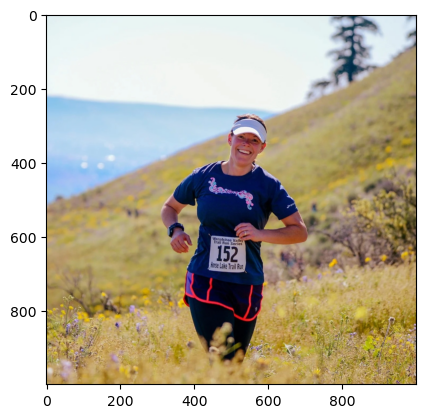

In [7]:
np_image = cv2.imread('pexels.jpg')
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB)
np_image = cv2.resize(np_image, dsize=(1000, 1000))
plt.imshow(np_image)

In [8]:
def sliding_window(image, step, ws):
  for y in range(0, image.shape[0]-ws[1]+1, step):
    for x in range(0, image.shape[1]-ws[0]+1, step):
      yield (x, y, image[y:y + ws[1], x:x +ws[0]])

In [9]:
windows = sliding_window(np_image, 200, (200, 200))

In [12]:
os.makedirs('sliding_window')

C:\Users\andre\AppData\Local\Temp\ipykernel_6308\1602578816.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))


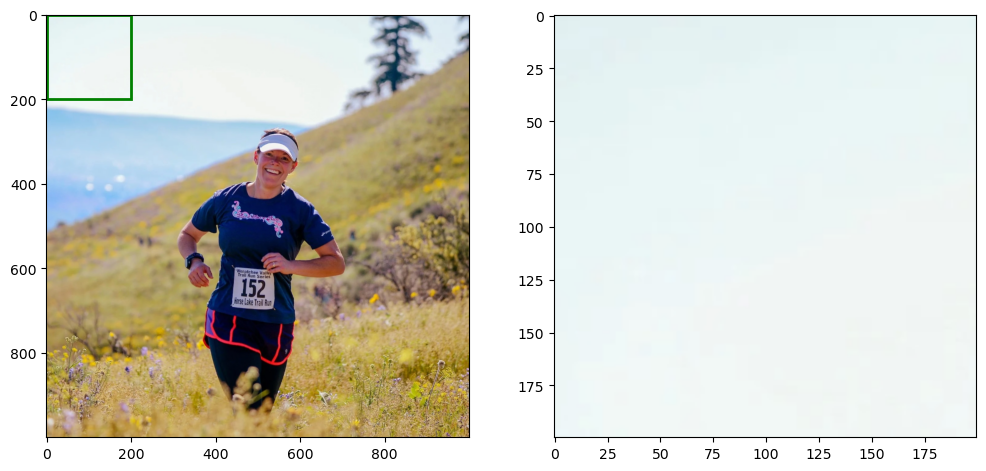

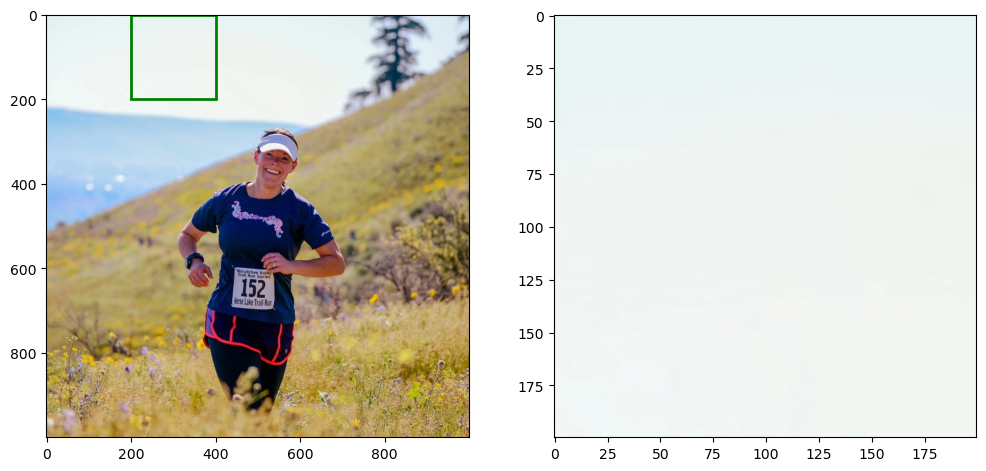

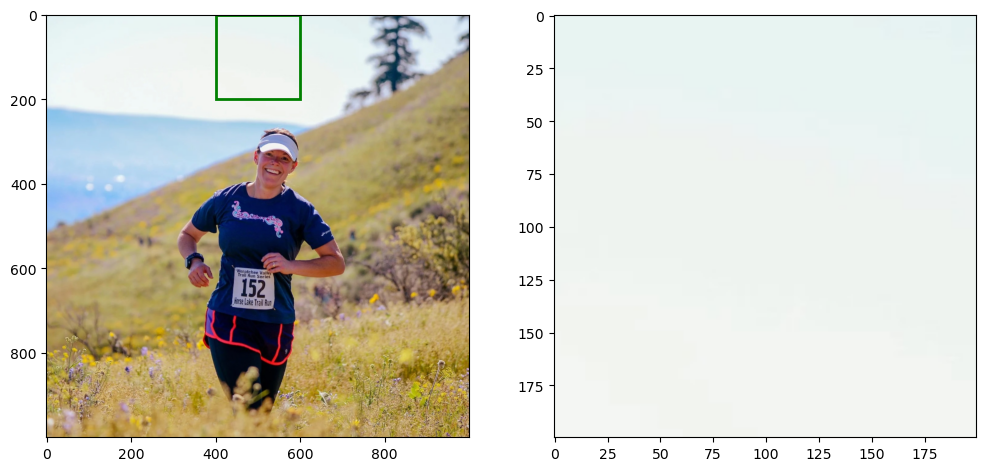

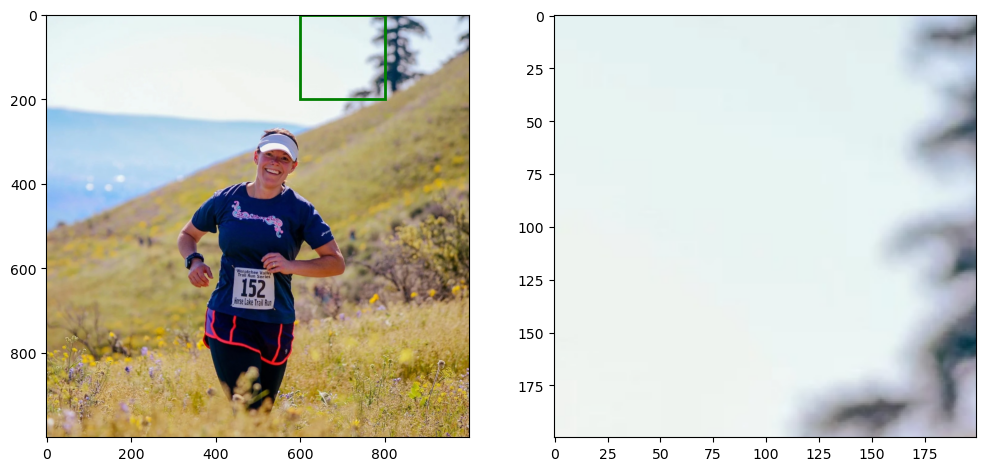

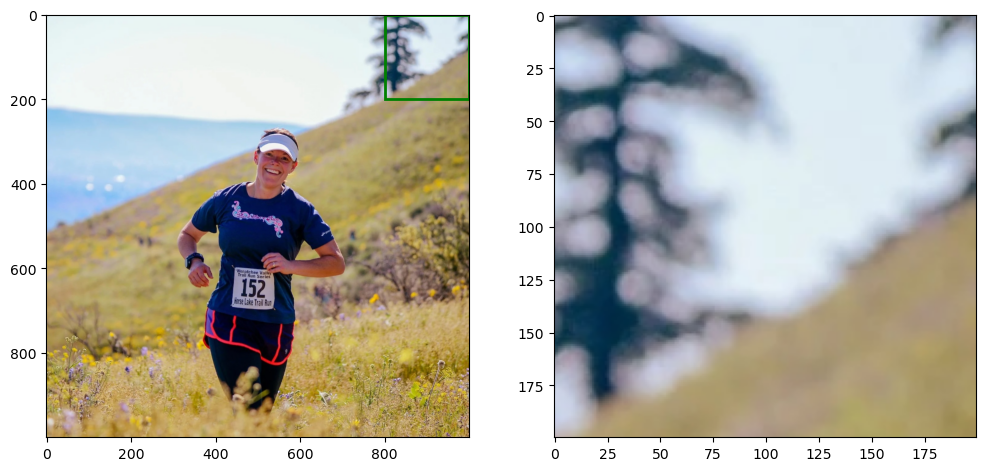

...

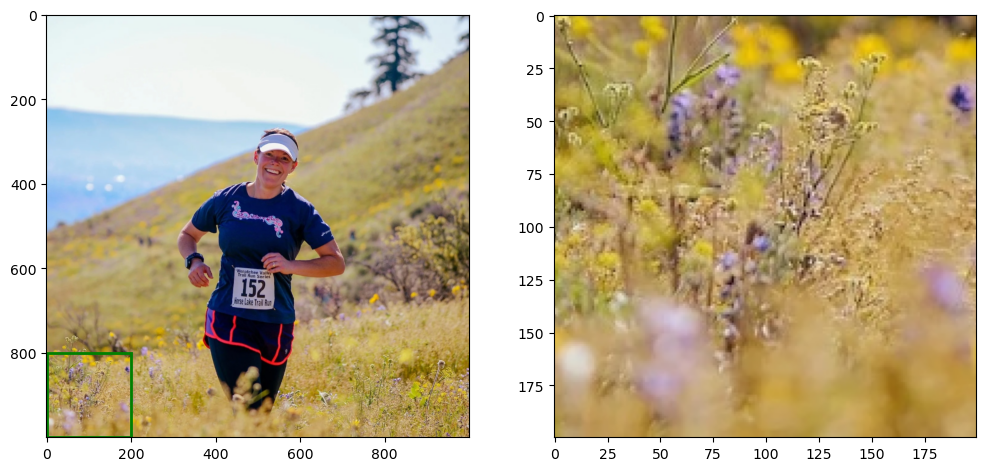

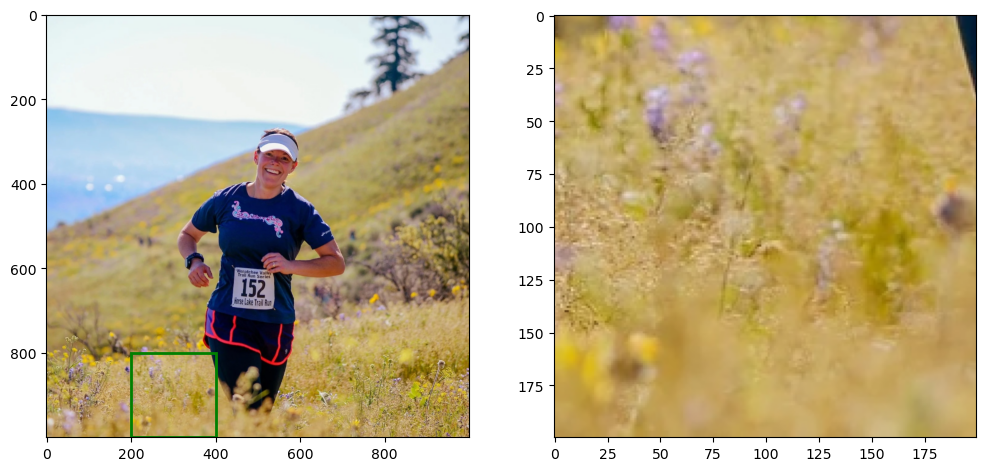

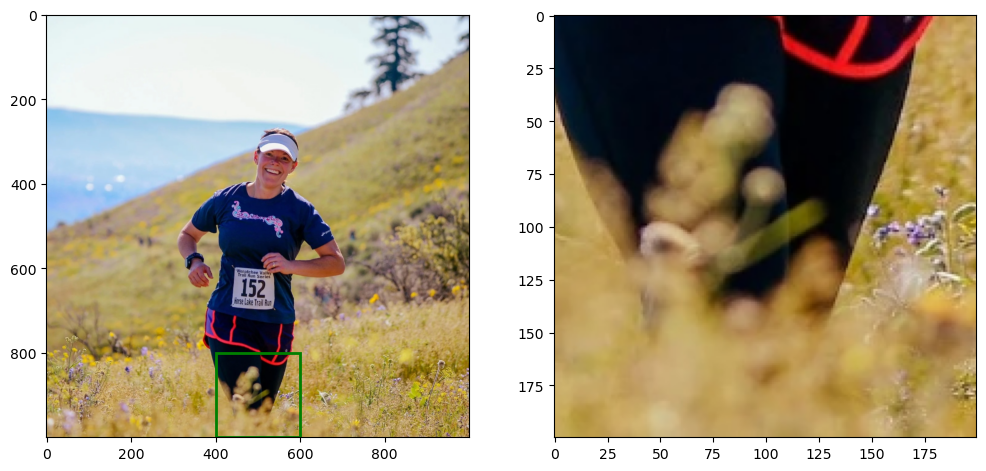

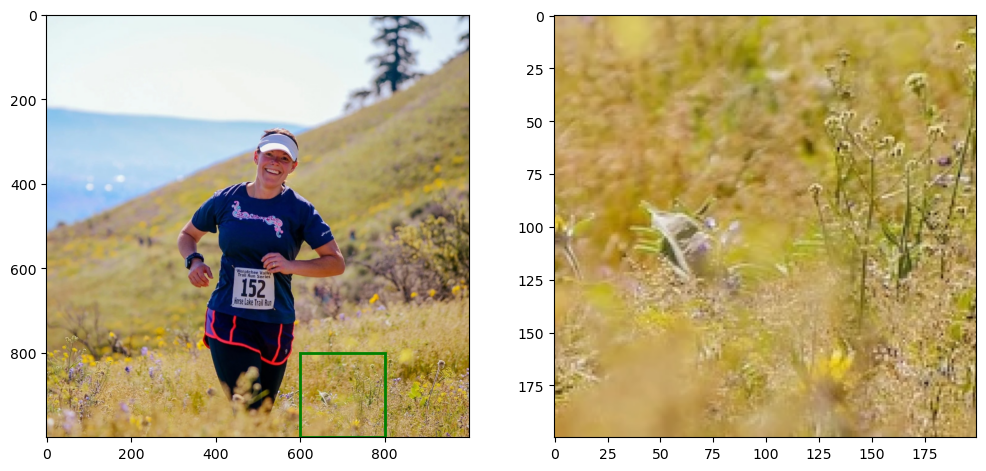

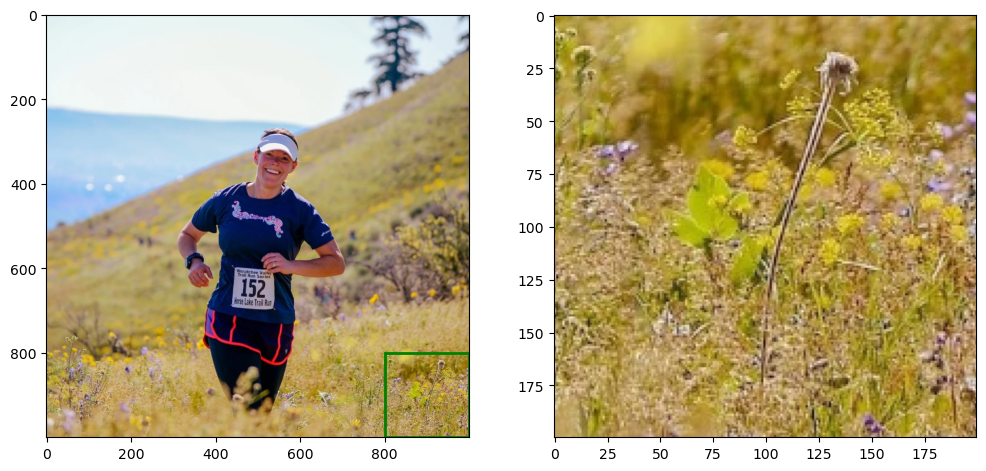

In [11]:
for x, window in enumerate(windows):
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))
  axarr[0].imshow(np_image)
  rect = patches.Rectangle((window[0], window[1]), 200, 200, linewidth=2, edgecolor='g', facecolor='none')
  axarr[0].add_patch(rect)
  axarr[1].imshow(window[2])
  f.savefig('sliding_window/'+str(x)+'.png', dpi=f.dpi)

In [13]:
image_folder = 'sliding_window'
video_name = 'video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith('.png')]

In [14]:
images = sorted(images, key=lambda x: int(os.path.splitext(x)[0]))

In [15]:
frame = cv2.imread(os.path.join(image_folder, images[0]))

In [16]:
height, width, layer = frame.shape

In [17]:
video = cv2.VideoWriter(video_name, 0, 1, (width, height))

In [18]:
for image in images:
  video.write(cv2.imread(os.path.join(image_folder, image)))
video.release()

# Trabajando con métricas de object detection

In [19]:
def bb_intersection_over_union(ground_truth_bbox, predicted_bbox):
  xA = max(ground_truth_bbox[0], predicted_bbox[0])
  yA = max(ground_truth_bbox[1], predicted_bbox[1])
  xB = min(ground_truth_bbox[2], predicted_bbox[2])
  yB = min(ground_truth_bbox[3], predicted_bbox[3])

  intersection_area = max(0, xB-xA + 1) * max(0, yB-yA + 1)

  ground_truth_bbox_area = (ground_truth_bbox[2] - ground_truth_bbox[0] + 1) * (ground_truth_bbox[3] - ground_truth_bbox[1] + 1)
  predicted_bbox_area = (predicted_bbox[2] - predicted_bbox[0] + 1) * (predicted_bbox[3] - predicted_bbox[1] + 1)

  iou = intersection_area / float(ground_truth_bbox_area + predicted_bbox_area - intersection_area)

  return iou

In [21]:
image = cv2.imread('pexels.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


In [22]:
example = ([1400, 850, 1650, 1100], [1400, 850, 1600, 1100])

In [23]:
iou = bb_intersection_over_union(example[0], example[1])

In [24]:
print('Valor IoU ' + str(iou))

Valor IoU 0.8007968127490039


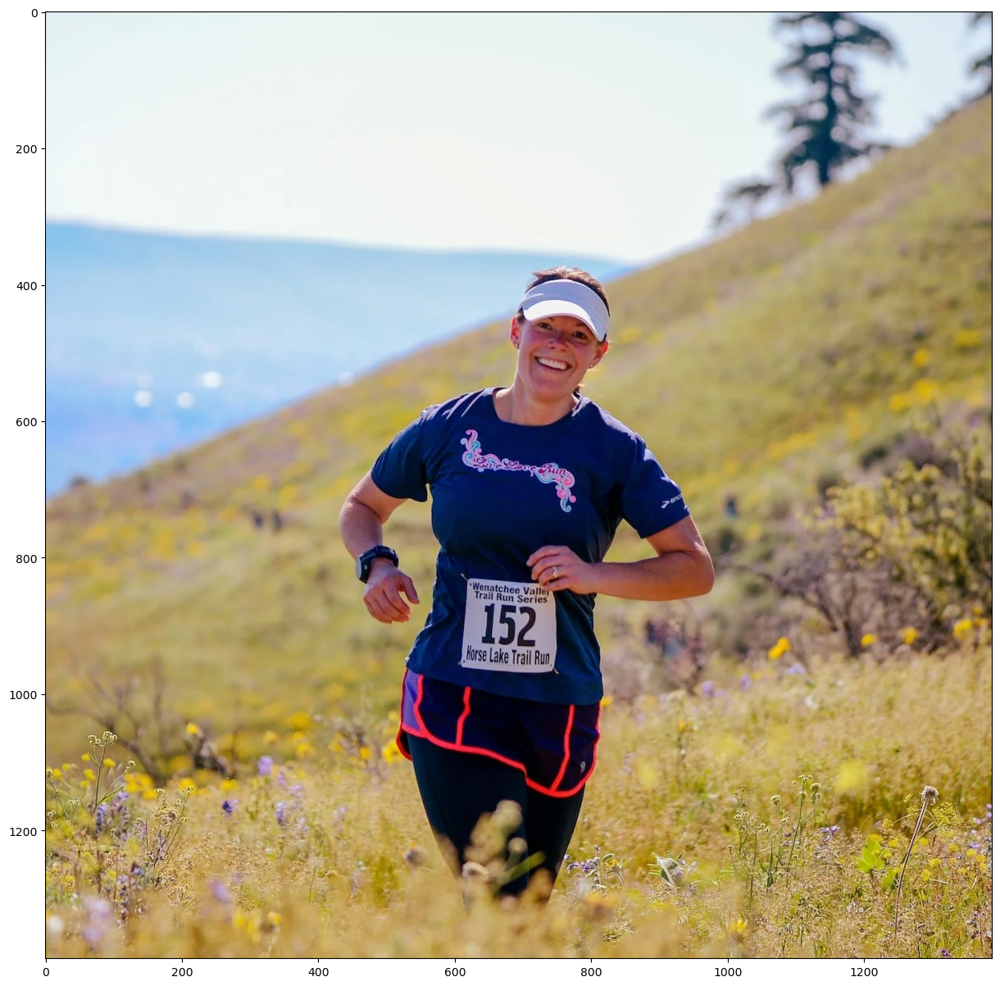

In [25]:
fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(image)
rect = patches.Rectangle(tuple(example[0][:2]), example[0][2]-example[0][0], example[0][3]-example[0][1], linewidth=3, edgecolor='g', facecolor='none')
ax.add_patch(rect)

rect = patches.Rectangle(tuple(example[1][:2]), example[1][2]-example[1][0], example[1][3]-example[1][1], linewidth=3, edgecolor='r', facecolor='none')
ax.add_patch(rect)

plt.show()
